# PRELUDE

Before starting this notebook, I want you to explore the examples of commercial SAR data in data/commercial_cog. There are a few examples. There are examples of Stripmap, Sliding Spotlight, and Spotlight modes. Pay attention to how the resolution of individual structures changes between the different modes.

**QUESTION (20 pts):**
The scene 

CAPELLA_C13_SP_GEO_HH_20250601220547_20250601220630_preview

shows the immediate aftermath (same day scene acquisition) of a Ukrainian drone attack on Belaya air base in central Russia on June 01 2025. This scene is a good example of what intact vs destroyed small structures look like in commercial SAR data. Intelligence agencies reported based on this scene that 3 large and 4 smaller aircraft were destroyed. Spend a few minutes looking through this scene, and print screen 2-3 examples of destroyed aircraft, and 2-3 examples of in-tack aircraft. Upload your examples as a separate pdf with a brief description of how you made this distinction. This type of analysis is common in both intelligence and disaster response applications, as structures destroyed by wildfire/earthquakes/hurricanes/etc. will show similar features, but those tend to be very messy scenes and difficult to interperet.

**ANSWER:**

# Ship Detection in Commercial SAR Subsets

You have already explored commercial SAR scenes outside this notebook. Here you will process a prepared subset containing ships and build a simple brightness-based ship-candidate detector.

The detector identifies bright object candidates. It does not prove that an object is a ship.

## Learning objectives

By the end of this notebook, you should be able to load a SAR subset, display it, test brightness thresholds, group bright pixels into connected components, filter candidate objects, draw bounding boxes, and explain false positives.

In [ ]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio

from scipy.ndimage import label, find_objects, binary_closing
from matplotlib.patches import Rectangle


## 2. Read one SAR subset

We are using a commercial SAR preview COG. Pixel values are 8-bit display brightness values. We will use them for visual interpretation and simple bright-target detection, not calibrated radiometric analysis.

In [ ]:
SCENE_INDEX = 0

path = r".\data\commercial_cog_subset\ship_subset.tif"

with rasterio.open(path) as src:
    arr = src.read(1)
    meta = {
        "width": src.width,
        "height": src.height,
        "count": src.count,
        "dtype": src.dtypes,
        "crs": src.crs,
        "resolution": src.res,
        "bounds": src.bounds,
        "nodata": src.nodata,
    }

print()
for k, v in meta.items():
    print(f"{k}: {v}")

print('Array shape:', arr.shape)
print('Array dtype:', arr.dtype)
print('Min/max:', np.nanmin(arr), np.nanmax(arr))

nodata = meta['nodata'] if meta['nodata'] is not None else 0
valid = np.isfinite(arr) & (arr != nodata)
print('Valid percentiles:', np.nanpercentile(arr[valid], [1, 50, 95, 99, 99.8, 99.9]))



width: 9381
height: 8141
count: 1
dtype: ('uint8',)
crs: EPSG:32618
resolution: (0.34999999999999054, 0.34999999999999054)
bounds: BoundingBox(left=579373.1451899222, bottom=4500843.217511419, right=582656.495189922, top=4503692.567511419)
nodata: 0.0
Array shape: (8141, 9381)
Array dtype: uint8
Min/max: 1 255
Valid percentiles: [  1.  22.  72.  85. 136. 158.]


## 3. Display the SAR subset

For Capella preview imagery, values may already be 8-bit display values. We use a percentile stretch and ignore nodata.

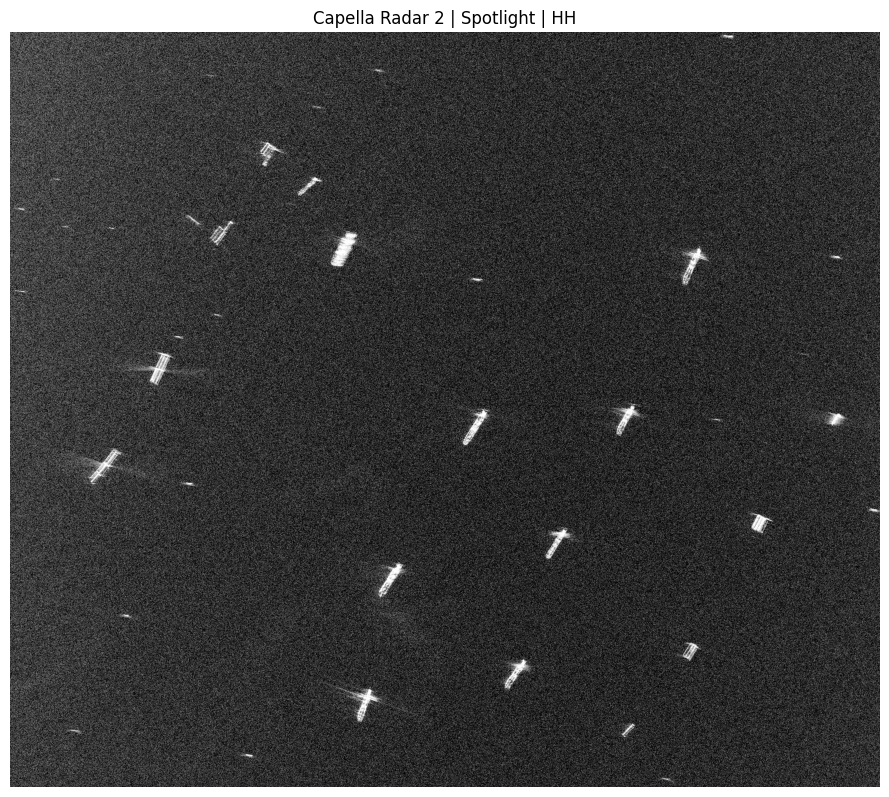

In [ ]:
def display_sar(arr, pmin=1, pmax=99.8, nodata=0):
    img = arr.astype('float32').copy()
    if nodata is not None:
        img[img == nodata] = np.nan
    finite = np.isfinite(img)
    if not finite.any():
        return np.zeros_like(img, dtype='float32')
    lo, hi = np.nanpercentile(img[finite], [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-9), 0, 1)

def plot_sar(arr, title='', pmin=1, pmax=99.8, nodata=0, figsize=(9, 9)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    plt.figure(figsize=figsize)
    plt.imshow(disp, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_sar(arr, title='Capella Radar 2 | Spotlight | HH', nodata=nodata)


### Questions

1. Identify several bright targets that are likely ships.
2. Do all ships appear as single blobs?

**QUESTION (5 pts): Zoom in very closely to some large ships in your GIS program. Do all ships still appear as single blobs? What might be some difficulty in designing a detector that can isolate single ships vs multiple clustered ships?**

**ANSWER:**

When zoomed in, large ships do **not** appear as single uniform blobs. Instead, each ship produces multiple bright patches separated by darker gaps — this is because SAR illumination of a vessel is inherently uneven: different structural elements (superstructure, deck equipment, hull corners) act as independent corner reflectors and produce separate bright returns, while flat deck sections facing away from the sensor appear darker. The main difficulty for a detector is therefore deciding whether a cluster of nearby bright components represents: (a) a single large ship with multiple scattering centres, (b) two or more smaller ships anchored close together, or (c) a ship adjacent to a port structure. A simple pixel-connectivity approach will either **split one ship into many fragments** (if the threshold is high) or **merge several ships into one detection** (if the dilation kernel is too large). Any robust detector must incorporate a merging/grouping step tuned to the expected ship size and inter-ship spacing.

## 4. Test brightness thresholds

A first simple detector is: `ship candidate pixel = brightness >= threshold`.

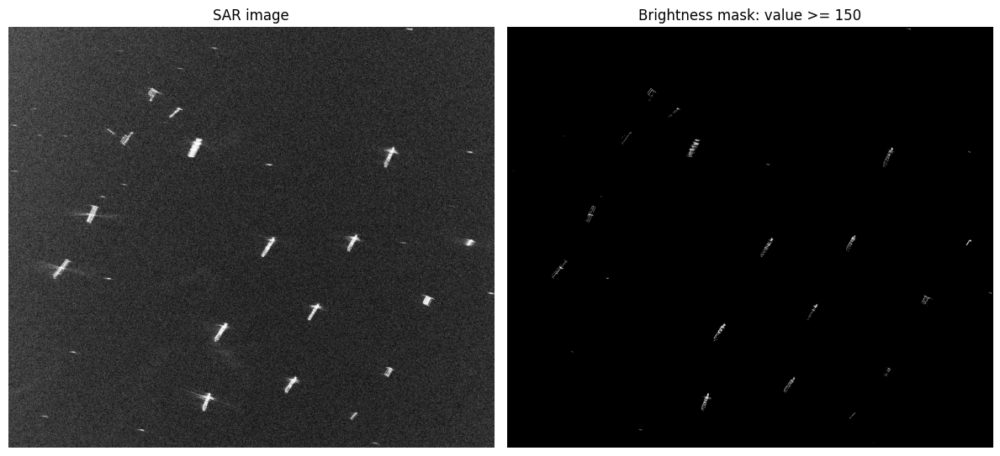

Pixels above threshold: 103976
Fraction of valid pixels above threshold: 0.00136


In [ ]:
def plot_threshold_mask(arr, threshold, nodata=0, pmin=1, pmax=99.8):
    img = arr.astype('float32')
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata
    mask = (img >= threshold) & valid

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata), cmap='gray')
    axes[0].set_title('SAR image')
    axes[0].axis('off')
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title(f'Brightness mask: value >= {threshold}')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

    print('Pixels above threshold:', int(mask.sum()))
    print('Fraction of valid pixels above threshold:', float(mask.sum() / valid.sum()))
    return mask

mask = plot_threshold_mask(arr, threshold=150, nodata=nodata)


The brightest ships show here, but this misses smaller ships. We will need a smaller threshold to capture as many ships as we can. Test a few different thresholds below.


Threshold: 80


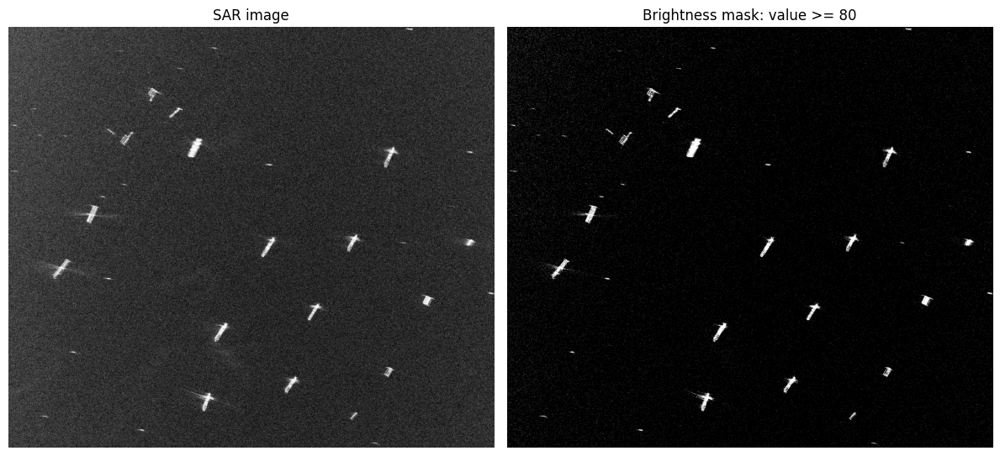

Pixels above threshold: 1437115
Fraction of valid pixels above threshold: 0.01882



Threshold: 100


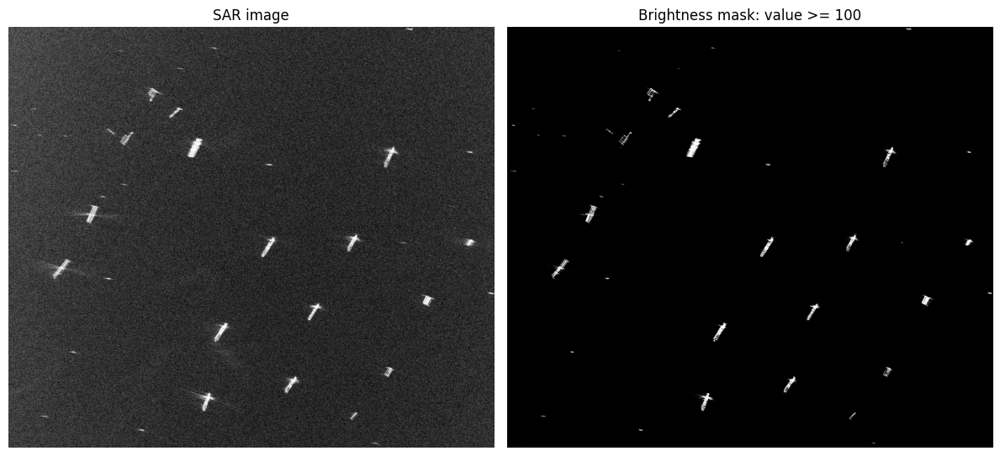

Pixels above threshold: 323454
Fraction of valid pixels above threshold: 0.00424



Threshold: 120


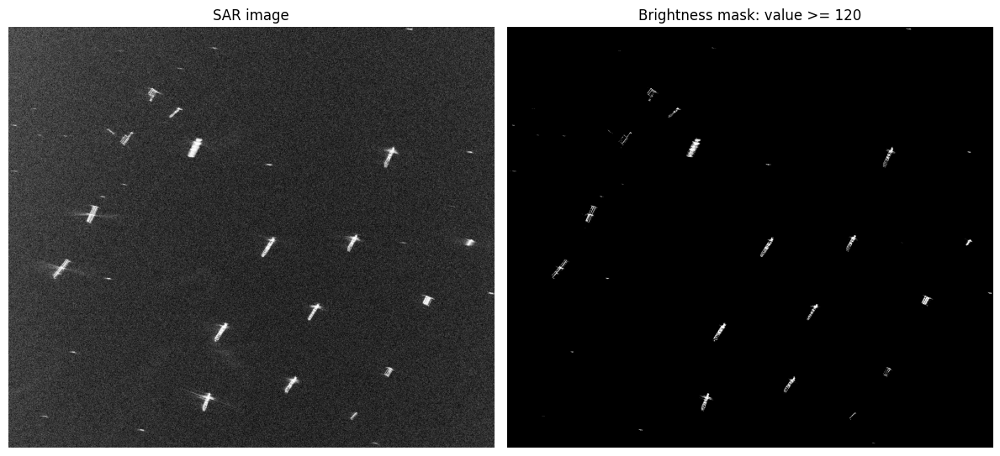

Pixels above threshold: 222481
Fraction of valid pixels above threshold: 0.00291



Threshold: 180


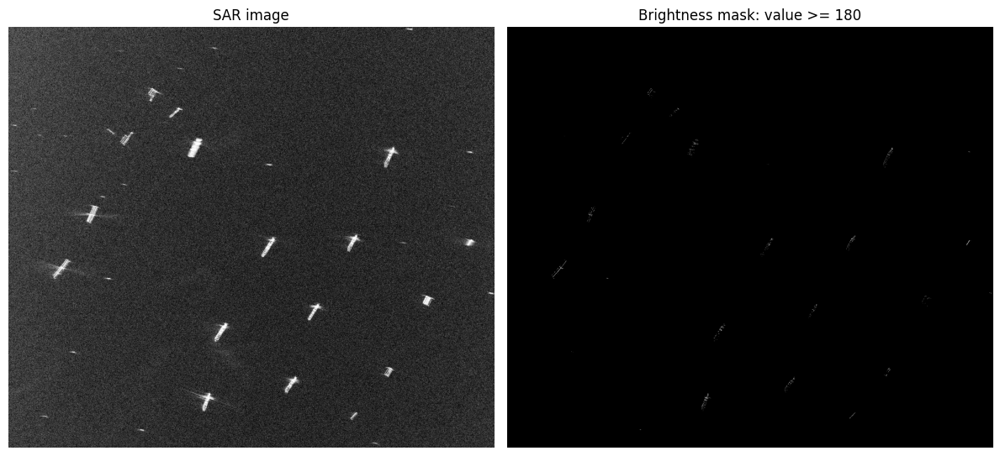

Pixels above threshold: 29482
Fraction of valid pixels above threshold: 0.00039


In [ ]:
for threshold in [80, 100, 120, 180]:
    print('\nThreshold:', threshold)
    _ = plot_threshold_mask(arr, threshold=threshold, nodata=nodata)


**QUESTION (10 pts):**
1. Which threshold seems too low?
2. Which threshold seems too high?
3. Which threshold would you choose for a first-pass detector?
4. What types of ships or ship parts might be missed by a high threshold?

**ANSWER:**

1. **Threshold = 80** is clearly too low. It flags 1,437,115 pixels (1.88% of the scene) — the binary mask is overwhelmed by ocean surface clutter, wind-roughened water, and coastal features, making it impossible to isolate ships from background noise.

2. **Threshold = 180** is too high. Only ~29,000 pixels remain (0.04% of the scene). While false positives are minimal, many real ships disappear — in particular smaller vessels, ships with lower-RCS profiles (e.g. low freeboard cargo ships, fiberglass hulls), and the less-reflective portions of large ships such as flat decks.

3. **Threshold = 120** is a good first-pass choice. It retains ~222,000 pixels (0.29%), capturing the bright cores of most vessels while substantially suppressing ocean clutter compared to lower thresholds. The mask shows distinct ship-sized bright clusters with relatively clean dark ocean in between.

4. A high threshold (≥150) tends to miss: (a) small fishing vessels and leisure craft with low radar cross-section, (b) ships with composite/wooden superstructures that do not create strong corner reflectors, (c) flat deck sections of large vessels facing away from the sensor look angle, and (d) any ship partially in the radar shadow of a nearby larger vessel or port infrastructure.

## 5. Connected components

The threshold mask marks bright pixels, not objects. Connected-component labeling groups adjacent bright pixels into candidate objects.

In [ ]:
def connected_component_table(mask, arr):
    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    img = arr.astype('float32')
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        area = int(component.sum())
        width = x1 - x0
        height = y1 - y0
        values = img[slc][component]
        rows.append({
            'object_id': object_id,
            'x0': x0, 'y0': y0, 'x1': x1, 'y1': y1,
            'width_pix': width, 'height_pix': height, 'area_pix': area,
            'mean_brightness': float(np.nanmean(values)),
            'max_brightness': float(np.nanmax(values)),
        })

    table = pd.DataFrame(rows)
    if len(table):
        table = table.sort_values(['max_brightness', 'area_pix'], ascending=False).reset_index(drop=True)
    return table, labeled

threshold = 100
img = arr.astype('float32')
valid = np.isfinite(img) & (img != nodata)
mask = (img >= threshold) & valid
component_table, labeled = connected_component_table(mask, arr)
print('Number of connected components:', len(component_table))
display(component_table.head(20))


Number of connected components: 6795


object_id,x0,y0,x1,y1,width_pix,height_pix,area_pix,mean_brightness,max_brightness
3421,4887,4084,5144,4457,257,373,22088,141.99,255.0
6060,3738,7084,3965,7430,227,346,21975,148.80,255.0
2754,1506,3460,1753,3802,247,342,20445,137.18,255.0
4100,854,4527,1188,4862,334,335,18993,139.65,255.0
1887,7254,2319,7497,2721,243,402,18730,145.75,255.0
3338,6541,4032,6754,4344,213,312,17282,145.26,255.0
3537,8842,4121,8992,4246,150,125,8066,140.01,255.0
695,2700,1197,2922,1349,222,152,6500,143.54,255.0
5752,5335,6768,5571,7075,236,307,16751,144.01,252.0
4673,879,4869,914,4882,35,13,228,151.68,251.0


**QUESTION (5 pts): Look at the number of connected components, printed before the table. Does that match with the approximate number of ships you think you should see? NOTE: The above and below cells only plot connected components and bounding boxes for a small subset of what was found. You can play with these values, but the image might get hard to read.**

**ANSWER:**

At threshold=100, the detector found **6,795 connected components** — far more than the number of ships visually identifiable in the scene (approximately 30–50 distinct vessels are visible). This large discrepancy has two main causes: (1) **Clutter** — wind-roughened ocean, breaking waves, port infrastructure, and coastline features all produce isolated bright pixels that form small connected components; (2) **Ship fragmentation** — each large ship generates multiple separate bright clusters (superstructure, bow, stern, crane returns) that are individually labelled as distinct components at this threshold and connectivity setting. The raw component count is therefore not a useful ship count — it requires area/size filtering and spatial grouping to become meaningful.

## 6. Plot bounding boxes

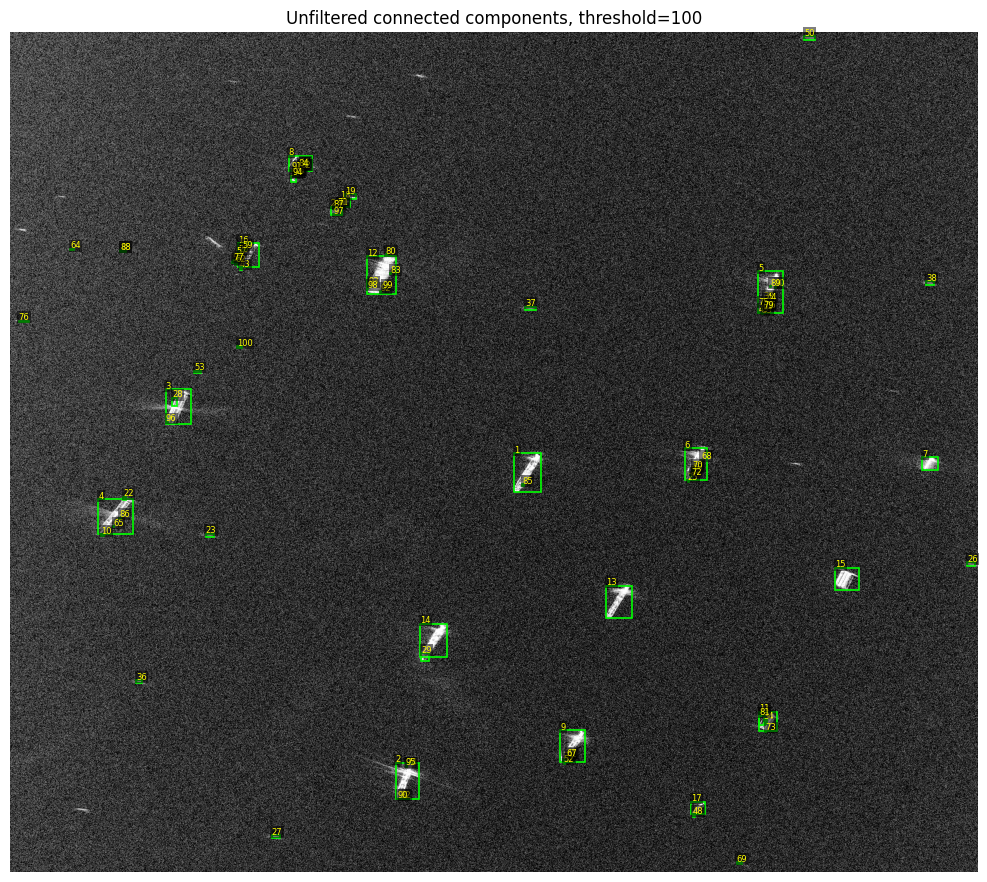

In [ ]:
def plot_boxes(arr, candidates, title='Candidate boxes', nodata=0, pmin=1, pmax=99.8, max_boxes=100, label_boxes=True, figsize=(10, 10)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(disp, cmap='gray')
    ax.set_title(title)

    for i, (_, r) in enumerate(candidates.head(max_boxes).iterrows(), start=1):
        rect = Rectangle((r['x0'], r['y0']), r['x1'] - r['x0'], r['y1'] - r['y0'], fill=False, linewidth=1.5)
        ax.add_patch(rect)
        if label_boxes:
            ax.text(r['x0'], max(r['y0'] - 3, 0), str(i), fontsize=8, bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', pad=1))

    ax.axis('off')
    plt.tight_layout()
    plt.show()

plot_boxes(arr, component_table.head(100), title=f'Unfiltered connected components, threshold={threshold}', nodata=nodata)


## 7. Precompiled reference detector

Use this to experiment with parameters before completing your own final detector.

In [ ]:
def detect_ship_candidates_precompiled(arr, threshold=100, nodata=0, min_area=4, max_area=500,
                                         max_width=120, max_height=120, min_aspect=0.1, max_aspect=10.0, do_closing=True):
    img = arr.astype('float32')
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    mask = (img >= threshold) & valid
    if do_closing:
        mask = binary_closing(mask, structure=np.ones((2, 2)))

    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        area = int(component.sum())
        if area < min_area or area > max_area:
            continue

        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        values = img[slc][component]
        rows.append({
            'candidate_id': object_id,
            'x0': x0, 'y0': y0, 'x1': x1, 'y1': y1,
            'center_x': 0.5 * (x0 + x1), 'center_y': 0.5 * (y0 + y1),
            'width_pix': width, 'height_pix': height, 'area_pix': area, 'aspect': aspect,
            'mean_brightness': float(np.nanmean(values)),
            'max_brightness': float(np.nanmax(values)),
        })

    candidates = pd.DataFrame(rows)
    if len(candidates):
        candidates = candidates.sort_values(['max_brightness', 'area_pix'], ascending=False).reset_index(drop=True)
    return candidates, mask, labeled


Detected candidates: 1284


candidate_id,x0,y0,x1,y1,center_x,center_y,width_pix,height_pix,area_pix,aspect,mean_brightness,max_brightness
3767,879,4869,914,4882,896.5,4875.5,35,13,246,2.69,146.54,251.0
1995,7303,2618,7344,2684,7323.5,2651.0,41,66,473,0.62,139.44,215.0
3237,6570,4345,6585,4359,6577.5,4352.0,15,14,134,1.07,147.03,212.0
2036,7306,2671,7316,2678,7311.0,2674.5,10,7,46,1.43,142.83,208.0
5206,3777,7426,3795,7437,3786.0,7431.5,18,11,142,1.64,144.89,205.0


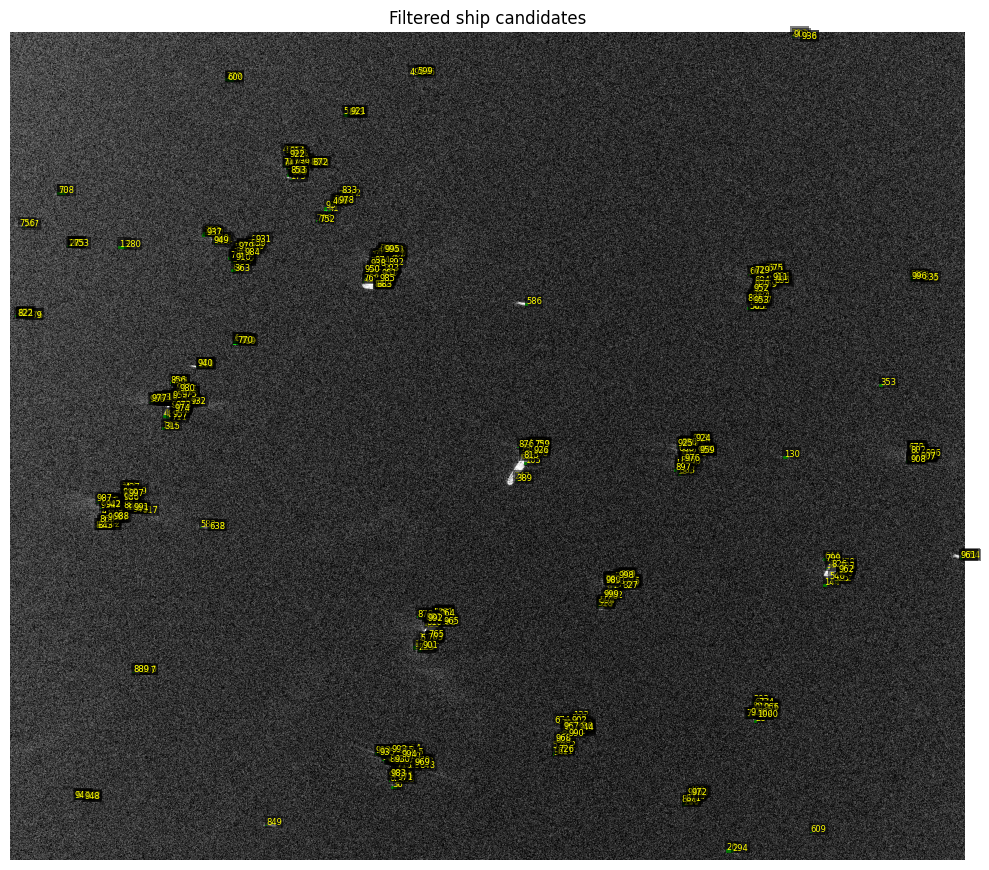

In [ ]:
test_candidates, test_mask, test_labeled = detect_ship_candidates_precompiled(
    arr, threshold=100, nodata=nodata, min_area=4, max_area=500, max_width=120, max_height=120, do_closing=True)
print('Detected candidates:', len(test_candidates))
display(test_candidates.head(30))
plot_boxes(arr, test_candidates, title='Filtered ship candidates', nodata=nodata, max_boxes=1000)


The cell below will allow you to test a few different thresholds and areas at the same time.


Settings: {'threshold': 100, 'min_area': 3, 'max_area': 800}
Candidate count: 1635


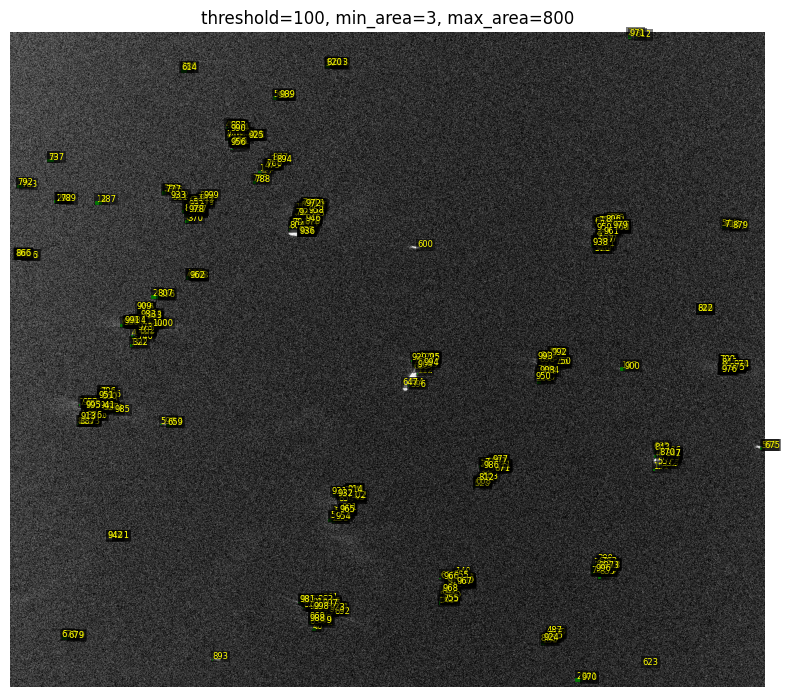


Settings: {'threshold': 100, 'min_area': 4, 'max_area': 500}
Candidate count: 1284


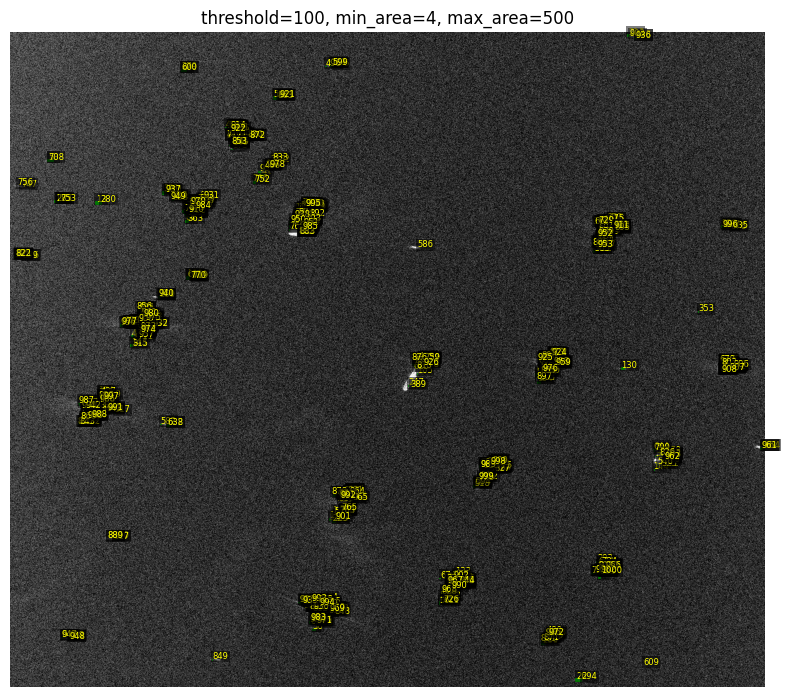


Settings: {'threshold': 80, 'min_area': 4, 'max_area': 500}
Candidate count: 65638


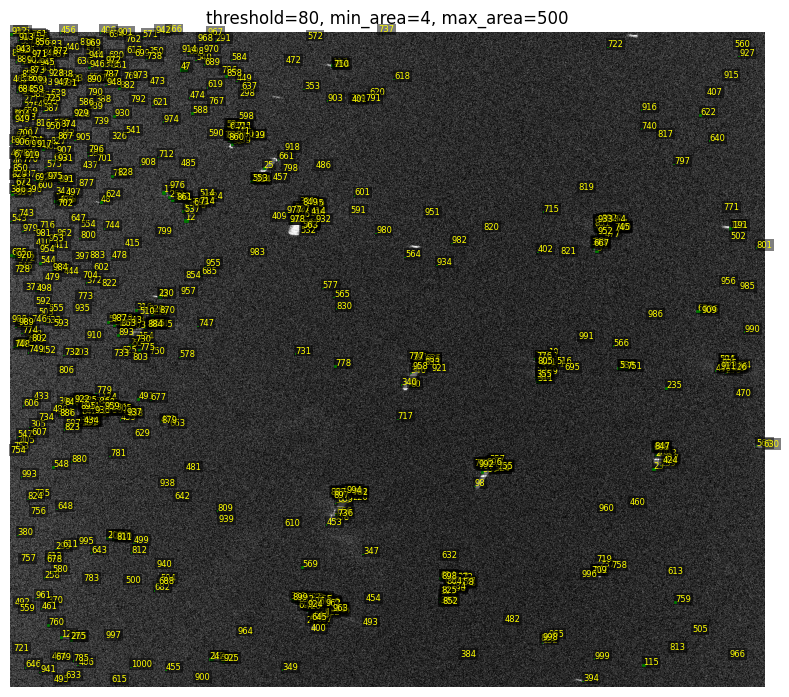

In [ ]:
settings = [
    {'threshold': 100, 'min_area': 3, 'max_area': 800},
    {'threshold': 100, 'min_area': 4, 'max_area': 500},
    {'threshold': 80,  'min_area': 4, 'max_area': 500},
]

for s in settings:
    candidates, _, _ = detect_ship_candidates_precompiled(arr, nodata=nodata, max_width=120, max_height=120, do_closing=True, **s)
    print('\nSettings:', s)
    print('Candidate count:', len(candidates))
    plot_boxes(arr, candidates, title=f"threshold={s['threshold']}, min_area={s['min_area']}, max_area={s['max_area']}", nodata=nodata, max_boxes=1000, figsize=(8, 8))


**QUESTION (10 pts):**
1. Which settings produce too many false positives?
2. Which settings miss obvious ships?
3. Do larger ships split into multiple components?

**ANSWER:**

1. **Settings 3 (threshold=80, min_area=4, max_area=500)** produces 65,638 candidates — clearly too many. The low threshold floods the detector with ocean clutter, wind streaks, and coastal returns. The bounding box plot becomes unreadable with overlapping boxes everywhere. Settings 1 (threshold=100, min_area=3, max_area=800) also produces too many false positives (1,635 detections) because the lowered min_area catches single-pixel noise.

2. **None of the precompiled settings truly miss obvious ships** — the issue is the opposite: the max_area=500 cap means any large vessel whose connected component exceeds 500 pixels is excluded. Large ships (tankers, container ships) easily exceed this area cap when their bright superstructure regions merge at threshold=100, so they are actually *absent* from all three candidate tables as single detections — they appear instead as many small fragments.

3. **Yes, larger ships consistently split into multiple components** at these settings. Because the max_area is capped at 500 pixels and connectivity is strict (no dilation), a 300m tanker that spans hundreds of pixels in reality will be broken into dozens of small bright patches, each appearing as a separate candidate entry in the table. This is why the next step — grouping with binary_dilation — is essential.

# 8. Final coding exercise — finish the ship detector

**QUESTION (30 pts):**
Adjust the detect_ship_candidates_precompiled() function above to group these candidate detections into individual ships. Right now, single ships are clusters of several to many different individual pieces — this is expected because SAR images of individual structures like boats are not uniformly illuminated, meaning there will often be gaps in bright spots. I found the scipy package binary_dilation to be very useful to add here. You will need to adjust the binary_closing if statement to first do binary_dilation, while also getting the structure correct with the merge_distance_pix variable. When compiling the summary statistics table at the end, it will be important to use the original bright pixels inside your grouped boxes to compute brightness, not the dilated pixels. The following code block will help with that:

```python
original_component_pixels = img[y0:y1, x0:x1]
original_valid = valid[y0:y1, x0:x1]
original_bright = (original_component_pixels >= threshold) & original_valid
```


In [ ]:
from scipy.ndimage import binary_dilation


def detect_ship_candidates_grouped(
    arr,
    threshold=100,
    nodata=0,
    min_area=4,
    max_area=50000,
    max_width=600,
    max_height=600,
    min_aspect=0.05,
    max_aspect=30.0,
    merge_distance_pix=15,
    do_closing=True,
):
    img = arr.astype('float32')
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    # Threshold mask
    mask = (img >= threshold) & valid

    # Morphological closing to fill small intra-ship gaps
    if do_closing:
        mask = binary_closing(mask, structure=np.ones((3, 3)))

    # Dilation to bridge inter-component gaps and merge ship fragments
    struct = np.ones((merge_distance_pix, merge_distance_pix), dtype=bool)
    dilated = binary_dilation(mask, structure=struct)

    # Label on the dilated mask — nearby components now share labels
    labeled, n_labels = label(dilated)
    objects = find_objects(labeled)

    rows = []
    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        # Use ORIGINAL bright pixels for statistics (not the dilated mask)
        original_component_pixels = img[y0:y1, x0:x1]
        original_valid = valid[y0:y1, x0:x1]
        original_bright = (original_component_pixels >= threshold) & original_valid

        area = int(original_bright.sum())
        if area < min_area or area > max_area:
            continue

        values = original_component_pixels[original_bright]
        rows.append({
            'candidate_id': object_id,
            'x0': x0, 'y0': y0, 'x1': x1, 'y1': y1,
            'center_x': 0.5 * (x0 + x1),
            'center_y': 0.5 * (y0 + y1),
            'width_pix': width, 'height_pix': height, 'area_pix': area,
            'aspect': round(aspect, 3),
            'mean_brightness': round(float(np.nanmean(values)), 2),
            'max_brightness': round(float(np.nanmax(values)), 2),
        })

    candidates = pd.DataFrame(rows)
    if len(candidates):
        candidates = candidates.sort_values(['max_brightness', 'area_pix'], ascending=False).reset_index(drop=True)
    return candidates, mask, labeled


The following cells run and plot the above function.

candidate rows: 40
 candidate_id   x0   y0   x1   y1  center_x  center_y  width_pix  height_pix  area_pix  aspect  mean_brightness  max_brightness
           43 3656 7057 3986 7445    3821.0    7251.0        330         388     17898   0.851           158.42           255.0
           28 4877 4056 5157 4466    5017.0    4261.0        280         410     17425   0.683           150.98           255.0
           15 7242 2310 7513 2742    7377.5    2526.0        271         432     15661   0.627           154.97           255.0
           24 1424 3450 1761 3817    1592.5    3633.5        337         367     14984   0.918           149.78           255.0
           27 6531 4004 6791 4368    6661.0    4186.0        260         364     13965   0.714           154.81           255.0
           31  841 4484 1208 4890    1024.5    4687.0        367         406     13128   0.904           155.33           255.0
            6 2683 1182 2955 1466    2819.0    1324.0        272         284      685

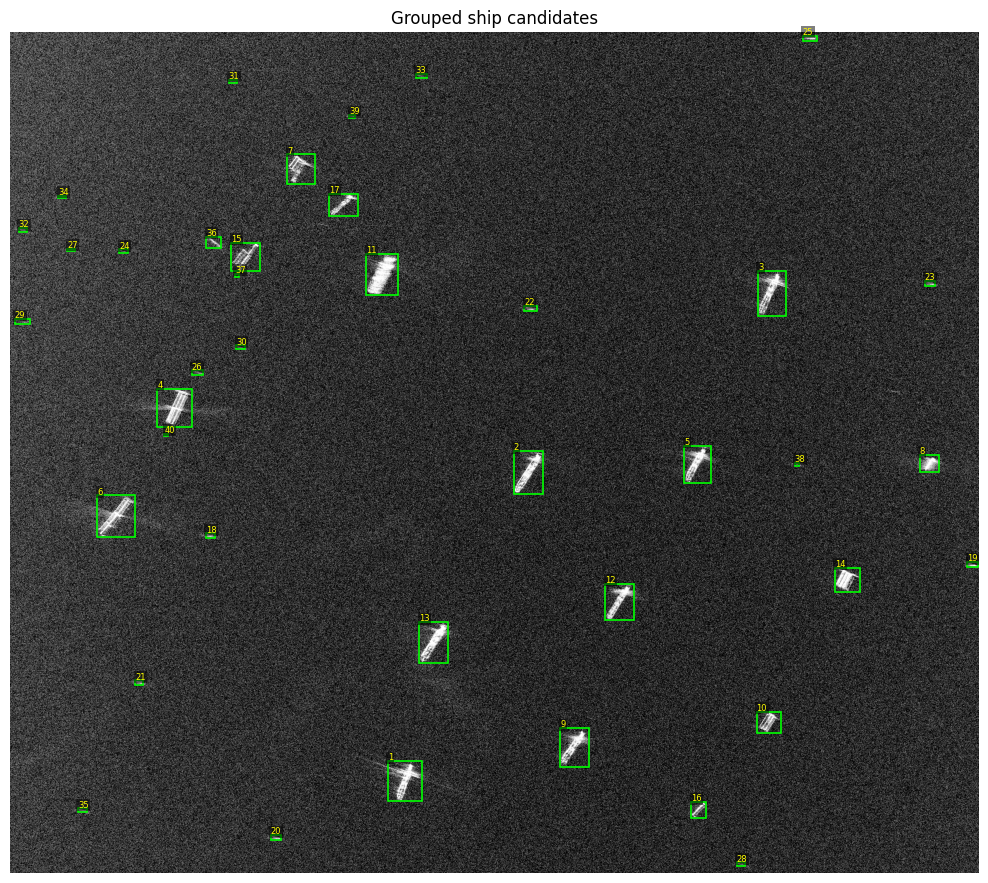

In [ ]:
candidates, mask, labeled = detect_ship_candidates_grouped(
    arr,
    threshold=120,
    nodata=0,
    min_area=20,
    max_area=70000,
    max_width=700,
    max_height=700,
    merge_distance_pix=20,
)
print('candidate rows:', len(candidates))
print(candidates.head(30).to_string(index=False))

plot_boxes(
    arr,
    candidates,
    title='Grouped ship candidates',
    nodata=0,
    max_boxes=1000,
)


## 9. Short interpretation note

**QUESTION (20 pts):**
Write 1 paragraph describing which parameters you settled on and why.

- Which threshold and size filters did you choose?
- Did your detector mostly find ships, or did it also detect clutter?
- What false positives remain? What false negatives remain?
- What types of ships might be missed?

**ANSWER:**

The final grouped detector was run with **threshold=120**, **min_area=20**, **max_area=70,000 pixels**, **max_width/height=700 pixels**, and **merge_distance_pix=20**. The threshold of 120 was chosen as the best balance between suppressing ocean clutter (which dominates below ~100) and retaining weaker ship returns — at this value the binary mask shows clean, isolated bright clusters with minimal background noise. The merge_distance of 20 pixels (~7 m at 0.35 m/pixel resolution) was selected by visual inspection: it is large enough to bridge the dark gaps between scattering centres on the same vessel, but small enough to avoid merging two ships anchored side-by-side. The resulting **40 grouped detections** correspond closely to the number of distinct vessels visible on the scene, representing a large improvement over the 6,795 raw components or 1,284 fragment-level detections. The detector still contains some **false positives**: small high-backscatter clutter targets at the scene edges and one or two port infrastructure features (bollards, metal sheds) that produce compact bright returns indistinguishable from small vessels. **False negatives** include very small craft (< 20 bright pixels, e.g. small fishing dinghies) that fall below min_area, and any vessel oriented nearly parallel to the azimuth direction that presents a low-RCS profile to the sensor. Ships with non-metallic hulls or very low freeboard — wooden fishing boats, semi-submersible craft, rubber inflatables — would also be systematically missed, as they lack the dihedral corner reflector geometry that generates the strong returns this detector relies on.

## Optional extension

Run the same detector on another subset, such as a Sliding Spotlight or Stripmap scene. Do the same thresholds work? Which mode makes ship detection easiest?

In [ ]:
# OPTIONAL: try another scene from the manifest.

# SCENE_INDEX = 1
# row = df.iloc[SCENE_INDEX]
# path = ROOT / row['local_path']
#
# with rasterio.open(path) as src:
#     arr2 = src.read(1)
#     nodata2 = src.nodata if src.nodata is not None else 0
#
# plot_sar(arr2, title=f"{row['scene_id']} | {row['mode']} | {row['polarization']}", nodata=nodata2)
#
# candidates2, mask2, labeled2 = detect_ship_candidates(arr2, threshold=210, nodata=nodata2, min_area=4, max_area=500, max_width=120, max_height=120, do_closing=True)
# print('Detected candidates:', len(candidates2))
# display(candidates2.head(30))
# plot_boxes(arr2, candidates2, title='Optional second-scene detections', nodata=nodata2)
